In [1]:
import os
os.chdir('/Users/Sinead/DC-project/')
import matplotlib
import matplotlib.pyplot as plt
plt.ioff()
import numpy as np
import script
%matplotlib inline
import plotly 
plotly.offline.init_notebook_mode()
import find_eyes_reshape as fer
import nibabel as nib
import vtk

/Users/Sinead/anaconda/envs/project/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


In [2]:
PathDicoms = np.array(
    [['/Volumes/Backup Data/ASDH Samples/Sample1/Post-operative/R-N11-109/HeadSpi  1.0  J40s  3', 'Sample 1'],
     ['/Volumes/Backup Data/ASDH Samples/Sample2/Original/Post-op.nii', 'Sample 2'],
     ['/Volumes/Backup Data/ASDH Samples/Sample3/Post-op', 'Sample 3'],
     ['/Volumes/Backup Data/ASDH Samples/Sample4/Post-op', 'Sample 4'],
     ['/Volumes/Backup Data/ASDH Samples/Sample5/Post-op', 'Sample 5'],
     ['/Volumes/Backup Data/ASDH Samples/SampleA/Post-op', 'Sample A'],
     ['/Volumes/Backup Data/ASDH Samples/SampleB/Post-op', 'Sample B'],
     ['/Volumes/Backup Data/ASDH Samples/SampleC/Post-op', 'Sample C'],
     ['/Volumes/Backup Data/ASDH Samples/SampleD/Post-op', 'Sample D'],
     ['/Volumes/Backup Data/ASDH Samples/SampleF/Post-op', 'Sample F'],
     ['/Volumes/Backup Data/ASDH Samples/SampleG/Post-op', 'Sample G'],
     ['/Volumes/Backup Data/ASDH Samples/SampleH/Post-op', 'Sample H'],
     ['/Volumes/Backup Data/ASDH Samples/SampleI/Post-op', 'Sample I']])

In [78]:
PathDicom = PathDicoms[5][0]
samp = PathDicoms[5][1]

In [79]:
# threshold CT scan for eyes and bone and store in 2 different arrays

if PathDicom.endswith('.nii'):
    thresholded_bone=script.threshim_nii(700,1500)
    array_bone, ConstPixelSpacing = script.vtk2np_nii(thresholded_bone)
    thresholded_eyes = script.threshim_nii(0,80) # remove soft tissue
    array_eyes, ConstPixelSpacing = script.vtk2np_nii(thresholded_eyes)
    thresholded_visual=script.threshim_nii(-100,1500) 
    array_visual, ConstPixelSpacing = script.vtk2np_nii(thresholded_visual) 
else:
    thresholded_bone=script.threshim_dicom(700,1500)
    array_bone, ConstPixelSpacing = script.vtk2np(thresholded_bone)
    thresholded_eyes = script.threshim_dicom(0,80) # remove soft tissue
    array_eyes, ConstPixelSpacing = script.vtk2np(thresholded_eyes)
    thresholded_visual=script.threshim_dicom(-100,1500) 
    array_visual, ConstPixelSpacing = script.vtk2np(thresholded_visual) 

In [80]:
# reshape the arrays - don't run this twice
array_bone = script.reshape(array_bone, ConstPixelSpacing, 220, 160, array_bone.shape[0], array_bone.shape[2])
array_eyes = script.reshape(array_eyes, ConstPixelSpacing, 220, 160, array_eyes.shape[0], array_eyes.shape[2])
array_visual = script.reshape(array_visual, ConstPixelSpacing, 220, 160, array_visual.shape[0], array_visual.shape[2])

In [81]:
H, edges, data, hist_data_2c = fer.hist3d_all(array_eyes)

Optimization terminated successfully.
         Current function value: -23.384760
         Iterations: 41
         Function evaluations: 82
Optimization terminated successfully.
         Current function value: -18.009750
         Iterations: 40
         Function evaluations: 80


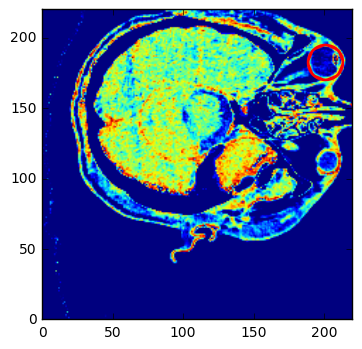

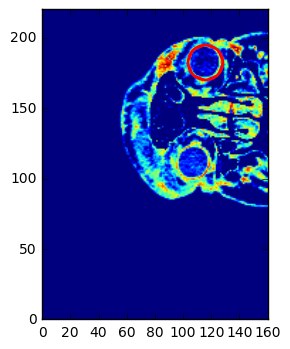

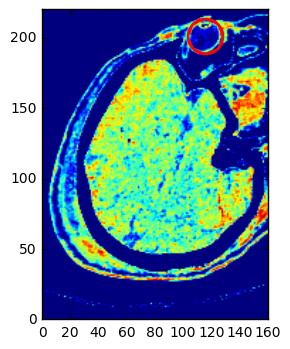

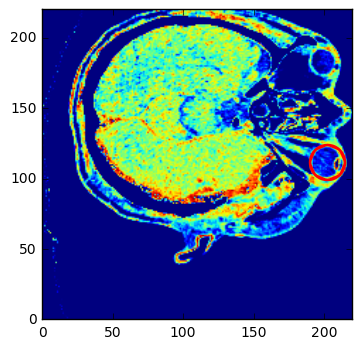

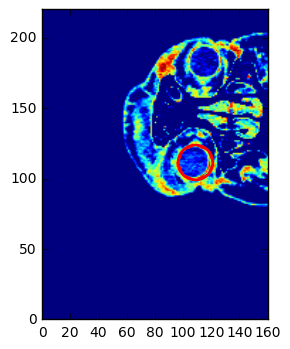

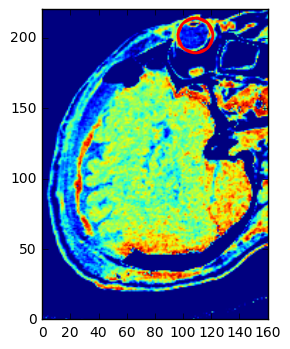

In [82]:
ranges_1, ranges_2, certainty = fer.ranges(H,edges)
c1,c2 = fer.coords(hist_data_2c, ranges_1, ranges_2)
fer.check_coords(c1,c2,array_eyes)

In [101]:
reload(fer)
angle1, angle2 = fer.angles_from_eyes(c1,c2)
rotated1, rotated2 = fer.correct_skews(angle1,angle2,array_bone)
array_eyes1, array_eyes = fer.correct_skews(angle1,angle2,array_eyes)
array_visual1, array_visual = fer.correct_skews(angle1,angle2,array_visual)

KeyboardInterrupt: 

In [138]:
angles, xcentroids, ycentroids, xmajor_axis_points, ymajor_axis_points = script.ellipses(rotated2)

In [103]:
reload(script)
slices, slice_angles = script.select_ellipses_range(angles)

script.py:141: SyntaxWarning:

import * only allowed at module level



<IPython.core.display.Javascript object>


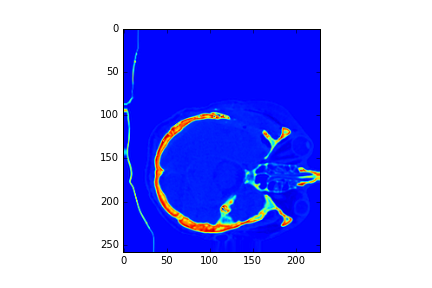

<IPython.core.display.Javascript object>


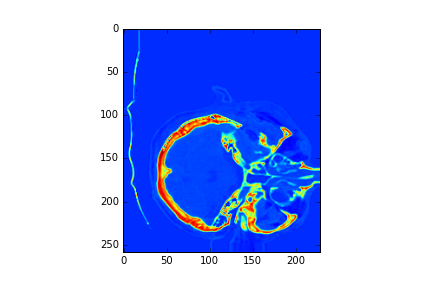

In [155]:
plt.ion()
%matplotlib nbagg
# if slices == ['use eyes']:
fig = plt.figure()
ax = fig.add_subplot(111)
ax.imshow(array_visual[:,:,len(array_visual)/2])

coords1 = []

def onclick(event):
    global ix, iy
    ix, iy = event.xdata, event.ydata
    print 'x = %d, y = %d'%(
        ix, iy)

    global coords1
    coords1.append((ix, iy))

    if len(coords1) == 2:
        fig.canvas.mpl_disconnect(cid)

    return None
cid = fig.canvas.mpl_connect('button_press_event', onclick)

fig2 = plt.figure()
ax2 = fig2.add_subplot(111)
ax2.imshow(array_visual[:,:,len(array_visual)/2+10])

coords2 = []

def onclick(event):
    global ix, iy
    ix, iy = event.xdata, event.ydata
    print 'x = %d, y = %d'%(
        ix, iy)

    global coords2
    coords2.append((ix, iy))

    if len(coords2) == 2:
        fig.canvas.mpl_disconnect(cid)

    return None
cid = fig.canvas.mpl_connect('button_press_event', onclick)

In [156]:
print coords1, coords2

[(45.714843749999972, 166.06734431003579), (222.09477206541217, 171.86931563620067)] [(45.714843749999972, 166.06734431003579), (222.09477206541217, 171.86931563620067)]


In [130]:
# one vector of plane, v1
v1 = np.array([0, 0, 1])
# second vector of plane, v2
v2 = np.array([np.cos(np.pi), np.sin(np.pi), 0])

In [137]:
# head_angles = slice_angles
# head_x = [xcentroids[i] for i in slices] 
# head_y = [ycentroids[i] for i in slices] 

In [125]:
reload(script)
a,b,c,d = script.find_plane_from_ellipses(rotated2, slices, head_x, head_y, head_angles)

TypeError: range() integer end argument expected, got str.

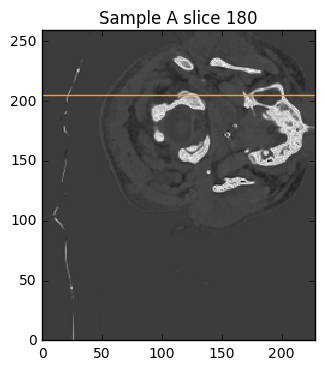

In [133]:
from matplotlib.colors import LinearSegmentedColormap
import pylab
cmap1 = LinearSegmentedColormap.from_list("my_colormap", ((0,0,0),(0.2, 0.2, 0.2),(0.3, 0.3, 0.3), (0.4, 0.4, 0.4),(0.5, 0.5, 0.5), (0.6,0.6,0.6),(0.7, 0.7, 0.7), (0.8, 0.8, 0.8), (0.9, 0.9, 0.9),(0.8, 0.8, 0.8),(0.7, 0.7, 0.7),(0.8, 0.8, 0.8),(0.9, 0.9, 0.9),(1,1,1)), N=256, gamma=1.0)

for slice_no in range(0,rotated2.shape[2],5):
    slice_ = array_visual[:,:,slice_no]
    plt.clf()
    plt.imshow(slice_, cmap=cmap1, interpolation='nearest')
    plt.xlim([0,array_visual.shape[1]])
    plt.ylim([0,array_visual.shape[0]])
    x = np.linspace(0,slice_.shape[0], 2)
    y = (d-c*slice_no-a*x)/b
    plt.plot(x,y, color='orange')
    plt.title('{} slice {}'.format(samp, slice_no))
    pylab.savefig('{}_slice_{}.png'.format(samp, slice_no))

In [43]:
script.visualise_single(rotated2, a,b,c,d, 130)

In [228]:
reload(script)
script.save_midplane(array_visual, a,b,c,d)

script.py:141: SyntaxWarning:

import * only allowed at module level

